In [1]:
import sys

# Add parent directory to path for imports
sys.path.insert(0, "/home/hgf_hmgu/hgf_gib4562/tdmpc2/")

import matplotlib.pyplot as plt
import numpy as np
import pickle
from tqdm import tqdm
import pandas as pd
import json
from pathlib import Path

import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
# Compute cosine similarity matrix between all gradient results
import torch.nn.functional as F

In [ ]:
def compute_success(df_data,
                    threshold_angle=0.1,
                    consecutive_steps=100,
                    starting_step=0,
                    column_name=None):
    """
    Compute whether the pole is upright (straight) for consecutive_steps time points.
    
    Args:
        df_data: DataFrame with 'observations' column containing state arrays
        threshold_angle: Maximum angle deviation from vertical (in radians) to consider "straight"
        consecutive_steps: Number of consecutive steps required for success
    
    Returns:
        df_data: DataFrame with added 'success' column
    """
    success = []

    for idx in range(len(df_data)):
        observations = np.array(df_data['observations'].iloc[idx])
        observations = observations[starting_step:]

        # Extract cos and sin of pole angle (dimensions 1 and 2)
        cos_angle = observations[:, 1]
        sin_angle = observations[:, 2]

        # Compute actual angle from cos and sin
        angles = np.arctan2(sin_angle, cos_angle)

        # Check if angle is within threshold (close to 0, which is upright)
        is_straight = np.abs(angles) < threshold_angle

        # Check for consecutive_steps consecutive True values
        episode_success = False
        count = 0
        for straight in is_straight:
            if straight:
                count += 1
                if count >= consecutive_steps:
                    episode_success = True
                    break
            else:
                count = 0

        success.append(episode_success)
    column_name = column_name if column_name is not None else 'success'
    df_data[column_name] = np.array(success)
    return df_data

In [16]:
def load_data(
    df_metadata,
    cart_position=None,
    pole_angle=None,
    normalization_method=None,
    seed=None,
):
    """
    Load intervention data from directories matching the specified criteria.
    
    Parameters can be single values or lists. If a parameter is None, it matches all values.
    
    Returns:
        pd.DataFrame: DataFrame with config info and episode data
    """

    # Convert single values to lists for uniform handling
    def to_list(val):
        if val is None:
            return None
        return val if isinstance(val, list) else [val]

    cart_position_list = to_list(cart_position)
    pole_angle_list = to_list(pole_angle)
    seed_list = to_list(seed)
    normalization_list = to_list(normalization_method)

    # Filter configs based on criteria
    filtered_configs = []
    for idx, config in df_metadata.iterrows():
        inital_state = config.get('initial_state')
        # Check each criterion
        if cart_position_list is not None and inital_state[
                0] not in cart_position_list:
            continue
        if pole_angle_list is not None and inital_state[
                1] not in pole_angle_list:
            continue
        if normalization_list is not None and config.get(
                'normalization_method') not in normalization_list:
            continue
        if seed_list is not None and config.get('config_seed') not in seed_list:
            continue

        filtered_configs.append(config)

    print(f"Found {len(filtered_configs)} configurations")
    # Load episode data for each matching config
    results = []
    for config in tqdm(filtered_configs):
        directory = Path(config['directory'])
        episode_path = directory / "activations" / "episode_data.pkl"

        if episode_path.exists():
            # Load the pickled episode data
            with open(episode_path, 'rb') as f:
                episode_data = pickle.load(f)

            # Unflatten the data structure
            episode_data = episode_data['data']
            for key, value in episode_data.items():

                if key == 'latent_states':
                    config[key] = value.squeeze()
                else:
                    config[key] = value

            results.append(config)

    return pd.DataFrame(results)


def flatten_dict(d, parent_key='', sep='_'):
    """
    Flatten a nested dictionary.
    
    Args:
        d: Dictionary to flatten
        parent_key: String to prepend to keys
        sep: Separator between nested keys
    
    Returns:
        Flattened dictionary
    """
    items = []
    for k, v in d.items():
        new_key = f"{parent_key}{sep}{k}" if parent_key else k
        if isinstance(v, dict):
            items.extend(flatten_dict(v, new_key, sep=sep).items())
        else:
            items.append((new_key, v))
    return dict(items)


def load_sweep_metadata(sweep_base_dirs):
    """
    Load and flatten metadata from one or more sweep base directories.

    Args:
        sweep_base_dirs: Path or list of Path objects/strings

    Returns:
        pd.DataFrame with flattened metadata for all runs in all provided directories
    """
    from tqdm import tqdm

    if isinstance(sweep_base_dirs, (str, Path)):
        sweep_base_dirs = [sweep_base_dirs]
    sweep_base_dirs = [Path(d) for d in sweep_base_dirs]

    all_metadata = []
    for sweep_base_dir in sweep_base_dirs:
        sweep_dirs = [d for d in sweep_base_dir.iterdir() if d.is_dir()]
        for sweep_dir in tqdm(sweep_dirs, desc=f"Dirs in {sweep_base_dir}"):
            metadata_path = sweep_dir / "activations" / "episode_metadata.json"
            if metadata_path.exists():
                with open(metadata_path, 'r') as f:
                    try:
                        metadata = json.load(f)
                        # Flatten the nested metadata dictionary
                        flattened_metadata = flatten_dict(metadata)
                        # Add the directory path
                        flattened_metadata['directory'] = str(sweep_dir)
                        all_metadata.append(flattened_metadata)
                    except json.JSONDecodeError:
                        print(f"Error decoding JSON for {metadata_path}")
                        continue

    print(f"Found {len(all_metadata)} configurations")
    # Create DataFrame from flattened metadata
    df_metadata = pd.DataFrame(all_metadata)
    return df_metadata


In [17]:
df_metadata = load_sweep_metadata(
    ["logs/25-12-09-cartpole_initial_conditions_seeds_models"])


Dirs in logs/25-12-09-cartpole_initial_conditions_seeds_models: 100%|██████████| 825/825 [00:00<00:00, 4556.29it/s]

Found 825 configurations


In [18]:
df_metadata.head()

,seed,initial_state,checkpoint,task,task_name,episode_idx,episode_length,total_reward,timestamp,obs_type,directory
0,5,"[-1.5, 2.5132741228718345]",ckpts/cartpole-swingup-3.pt,cartpole-swingup,cartpole-swingup,0,500,863.858354,2025-12-10T05:57:37.377523,state,logs/25-12-09-cartpole_initial_conditions_seed...
1,3,"[1.5, 3.7699111843077517]",ckpts/mt30-48M.pt,mt30,cartpole-swingup,0,500,730.063727,2025-12-09T23:44:23.604569,state,logs/25-12-09-cartpole_initial_conditions_seed...
2,3,"[-1.0, 3.141592653589793]",ckpts/mt30-317M.pt,mt30,cartpole-swingup,0,500,659.125960,2025-12-10T00:12:30.163649,state,logs/25-12-09-cartpole_initial_conditions_seed...
3,3,"[-1.5, 0.6283185307179586]",ckpts/cartpole-swingup-3.pt,cartpole-swingup,cartpole-swingup,0,500,828.025277,2025-12-10T05:26:48.880193,state,logs/25-12-09-cartpole_initial_conditions_seed...
4,3,"[0.0, 6.283185307179586]",ckpts/cartpole-swingup-3.pt,cartpole-swingup,cartpole-swingup,0,500,999.799019,2025-12-10T05:35:17.875506,state,logs/25-12-09-cartpole_initial_conditions_seed...


In [19]:
df = load_data(df_metadata)

Found 825 configurations


100%|██████████| 825/825 [00:08<00:00, 92.52it/s] 


In [ ]:
dim_names = {
    0: 'Cart Position',
    1: 'cos(Pole Angle)',
    2: 'sin(Pole Angle)',
    3: 'Cart Velocity',
    4: 'Pole Angular Velocity',
}

In [38]:
df = compute_success(df, starting_step=0, consecutive_steps=200)

In [39]:
df['init_cart_position'] = df['initial_state'].apply(lambda x: x[0])
df['init_pole_angle'] = df['initial_state'].apply(lambda x: x[1])
df['init_pole_angle_degrees'] = np.degrees(df['init_pole_angle'])
df['init_pole_angle_str'] = df['init_pole_angle_degrees'].round(0).astype(str)

for dim in range(5):
    df[f'average_dim_{dim}'] = df['observations'].apply(
        lambda x: np.mean(np.array(x)[:, dim]))

In [24]:
df['total_position_change'] = df['observations'].apply(
    lambda x: np.array(x)[-1, 0] - np.array(x)[0, 0])

In [25]:
df['cumulative_abs_position_change'] = df['observations'].apply(
    lambda x: np.sum(np.abs(np.diff(np.array(x)[:, 0]))))

df['cumulative_position_change'] = df['observations'].apply(
    lambda x: np.sum(np.diff(np.array(x)[:, 0])))

/scratch/slurm_tmpdir/job_1593200/ipykernel_3982204/1774401681.py:50: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([checkpoint_map[ckpt] for ckpt in checkpoint_order])
/scratch/slurm_tmpdir/job_1593200/ipykernel_3982204/1774401681.py:50: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([checkpoint_map[ckpt] for ckpt in checkpoint_order])
/scratch/slurm_tmpdir/job_1593200/ipykernel_3982204/1774401681.py:50: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([checkpoint_map[ckpt] for ckpt in checkpoint_order])
/scratch/slurm_tmpdir/job_1593200/ipykernel_3982204/1774401681.py:50: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a 

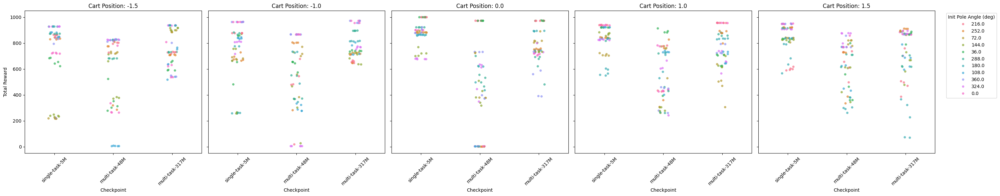

In [40]:
import seaborn as sns
import matplotlib.pyplot as plt

checkpoint_map = {
    'ckpts/cartpole-swingup-3.pt': 'single-task-5M',
    'ckpts/mt30-48M.pt': 'multi-task-48M',
    'ckpts/mt30-317M.pt': 'multi-task-317M',
}

# Get unique initial cart positions
unique_cart_positions = sorted(df['init_cart_position'].unique())

# Create a figure with subplots for each initial cart position
n_positions = len(unique_cart_positions)
fig, axes = plt.subplots(1,
                         n_positions,
                         figsize=(6 * n_positions, 6),
                         sharey=True)

# Handle case where there's only one position
if n_positions == 1:
    axes = [axes]

# Create a plot for each initial cart position
for idx, cart_pos in enumerate(unique_cart_positions):
    ax = axes[idx]

    # Filter data for this cart position
    df_subset = df[df['init_cart_position'] == cart_pos]

    # Map checkpoint paths to display names and set order
    checkpoint_order = list(checkpoint_map.keys())

    # Create stripplot with specified order
    sns.stripplot(data=df_subset,
                  x='checkpoint',
                  y='total_reward',
                  hue='init_pole_angle_str',
                  ax=ax,
                  alpha=0.7,
                  jitter=True,
                  order=checkpoint_order)

    # Set title and labels
    ax.set_title(f'Cart Position: {cart_pos}')
    ax.set_xlabel('Checkpoint')
    ax.set_ylabel('Total Reward' if idx == 0 else '')

    # Replace x-tick labels with mapped names
    ax.set_xticklabels([checkpoint_map[ckpt] for ckpt in checkpoint_order])
    ax.tick_params(axis='x', rotation=45)

    # Adjust legend
    if idx == n_positions - 1:
        ax.legend(title='Init Pole Angle (deg)',
                  bbox_to_anchor=(1.05, 1),
                  loc='upper left')
    else:
        ax.get_legend().remove()

plt.tight_layout()
plt.show()

/scratch/slurm_tmpdir/job_1593200/ipykernel_3982204/4172204624.py:58: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([checkpoint_map[ckpt] for ckpt in checkpoint_order])
/scratch/slurm_tmpdir/job_1593200/ipykernel_3982204/4172204624.py:58: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([checkpoint_map[ckpt] for ckpt in checkpoint_order])
/scratch/slurm_tmpdir/job_1593200/ipykernel_3982204/4172204624.py:58: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([checkpoint_map[ckpt] for ckpt in checkpoint_order])
/scratch/slurm_tmpdir/job_1593200/ipykernel_3982204/4172204624.py:58: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a 

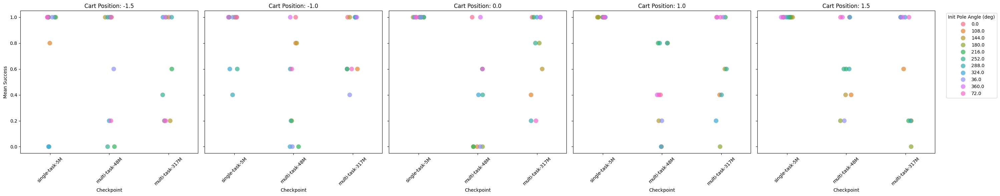

In [41]:
import seaborn as sns
import matplotlib.pyplot as plt

checkpoint_map = {
    'ckpts/cartpole-swingup-3.pt': 'single-task-5M',
    'ckpts/mt30-48M.pt': 'multi-task-48M',
    'ckpts/mt30-317M.pt': 'multi-task-317M',
}

# Get unique initial cart positions
unique_cart_positions = sorted(df['init_cart_position'].unique())

# Create a figure with subplots for each initial cart position
n_positions = len(unique_cart_positions)
fig, axes = plt.subplots(1,
                         n_positions,
                         figsize=(6 * n_positions, 6),
                         sharey=True)

# Handle case where there's only one position
if n_positions == 1:
    axes = [axes]

# Create a plot for each initial cart position
for idx, cart_pos in enumerate(unique_cart_positions):
    ax = axes[idx]

    # Filter data for this cart position
    df_subset = df[df['init_cart_position'] == cart_pos]

    # Map checkpoint paths to display names and set order
    checkpoint_order = list(checkpoint_map.keys())

    # Calculate mean success for each checkpoint and pole angle combination
    mean_success_df = df_subset.groupby(['checkpoint', 'init_pole_angle_str'
                                        ])['success'].mean().reset_index()
    mean_success_df.columns = [
        'checkpoint', 'init_pole_angle_str', 'mean_success'
    ]

    # Create stripplot with specified order
    sns.stripplot(data=mean_success_df,
                  x='checkpoint',
                  y='mean_success',
                  hue='init_pole_angle_str',
                  ax=ax,
                  alpha=0.7,
                  jitter=True,
                  size=10,
                  order=checkpoint_order)

    # Set title and labels
    ax.set_title(f'Cart Position: {cart_pos}')
    ax.set_xlabel('Checkpoint')
    ax.set_ylabel('Mean Success' if idx == 0 else '')

    # Replace x-tick labels with mapped names
    ax.set_xticklabels([checkpoint_map[ckpt] for ckpt in checkpoint_order])
    ax.tick_params(axis='x', rotation=45)

    # Adjust legend
    if idx == n_positions - 1:
        ax.legend(title='Init Pole Angle (deg)',
                  bbox_to_anchor=(1.05, 1),
                  loc='upper left')
    else:
        ax.get_legend().remove()

plt.tight_layout()
plt.show()


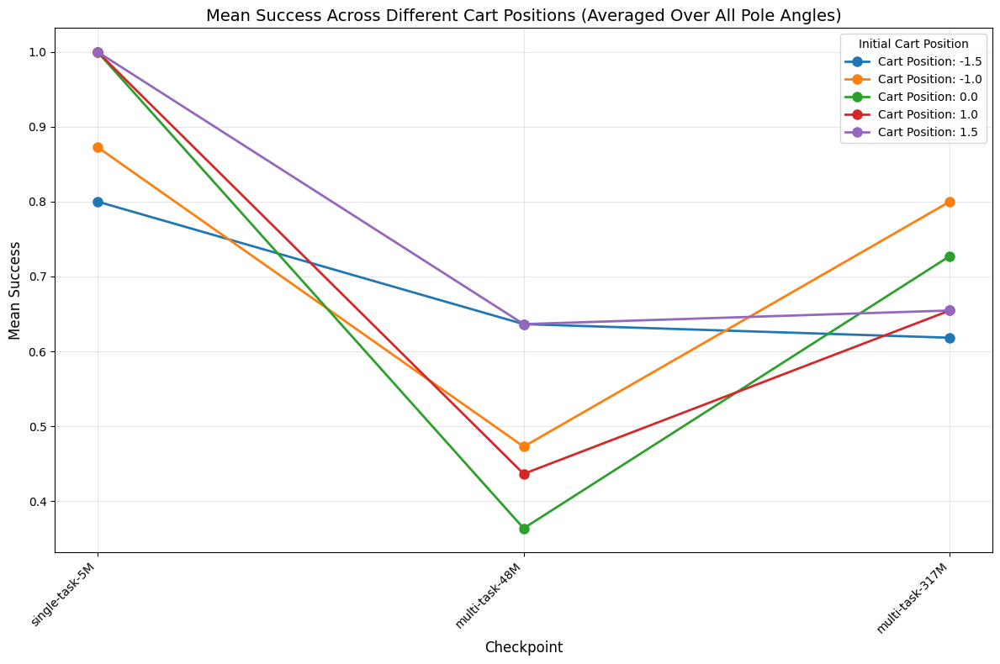

In [42]:
# Get unique initial cart positions and pole angles
unique_cart_positions = sorted(df['init_cart_position'].unique())
unique_pole_angles = sorted(df['init_pole_angle_str'].unique())

# Map checkpoint paths to display names and set order
checkpoint_order = list(checkpoint_map.keys())
checkpoint_labels = [checkpoint_map[ckpt] for ckpt in checkpoint_order]

# Create a single figure
fig, ax = plt.subplots(1, 1, figsize=(12, 8))

# Create a line plot with one line per cart position
for cart_pos in unique_cart_positions:
    # Filter data for this cart position
    df_subset = df[df['init_cart_position'] == cart_pos]

    # Calculate mean success across all pole angles for each checkpoint
    mean_success_by_checkpoint = df_subset.groupby(
        'checkpoint')['success'].mean()

    # Reindex to match checkpoint_order
    mean_success_ordered = mean_success_by_checkpoint.reindex(checkpoint_order)

    # Plot line for this cart position
    ax.plot(range(len(checkpoint_order)),
            mean_success_ordered.values,
            marker='o',
            linewidth=2,
            markersize=8,
            label=f'Cart Position: {cart_pos}')

# Set labels and title
ax.set_xlabel('Checkpoint', fontsize=12)
ax.set_ylabel('Mean Success', fontsize=12)
ax.set_title(
    'Mean Success Across Different Cart Positions (Averaged Over All Pole Angles)',
    fontsize=14)

# Set x-tick labels
ax.set_xticks(range(len(checkpoint_order)))
ax.set_xticklabels(checkpoint_labels, rotation=45, ha='right')

# Add legend
ax.legend(title='Initial Cart Position', loc='best')

# Add grid for better readability
ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

In [ ]:
sorted([float(x) for x in unique_pole_angles])

[0.0, 36.0, 72.0, 108.0, 144.0, 180.0, 216.0, 252.0, 288.0, 324.0, 360.0]

In [59]:
df = compute_success(df,
                     starting_step=0,
                     consecutive_steps=100,
                     threshold_angle=0.1)

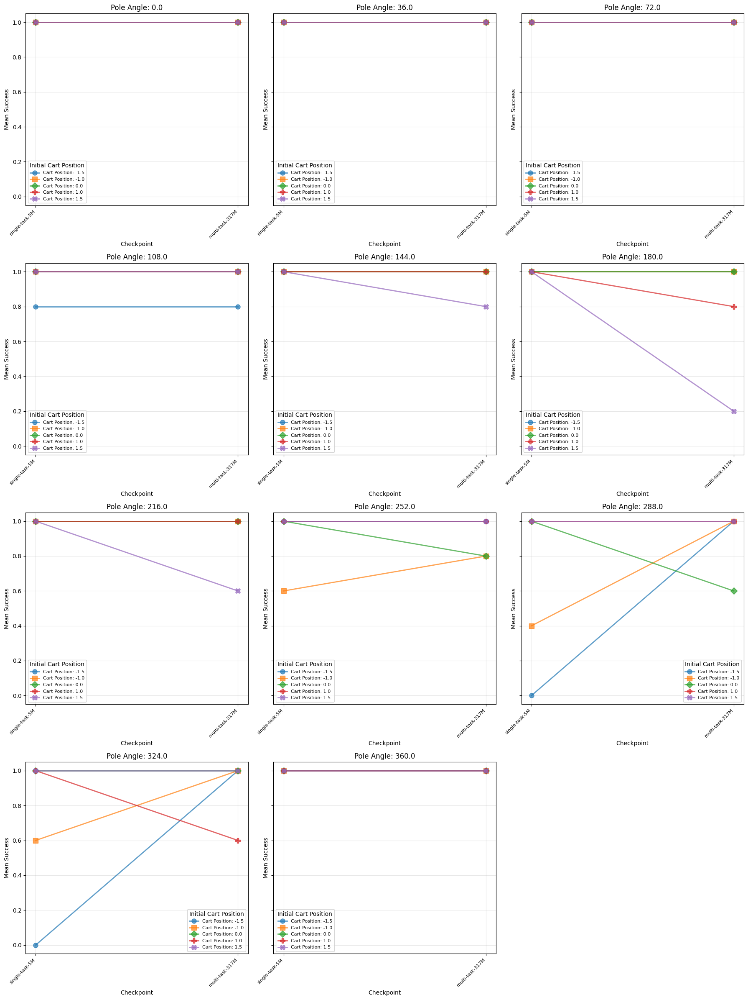

In [65]:
from itertools import cycle

checkpoint_map = {
    'ckpts/cartpole-swingup-3.pt': 'single-task-5M',
    #'ckpts/mt30-48M.pt': 'multi-task-48M',
    'ckpts/mt30-317M.pt': 'multi-task-317M',
}
# Get unique initial cart positions and pole angles
unique_cart_positions = sorted(df['init_cart_position'].unique())
unique_pole_angles = sorted(df['init_pole_angle_str'].unique())
unique_pole_angles = sorted([float(x) for x in unique_pole_angles])

# Map checkpoint paths to display names and set order
checkpoint_order = list(checkpoint_map.keys())
checkpoint_labels = [checkpoint_map[ckpt] for ckpt in checkpoint_order]

# Calculate number of rows needed (3 plots per row)
n_pole_angles = len(unique_pole_angles)
n_cols = 3
n_rows = (n_pole_angles + n_cols - 1) // n_cols  # Ceiling division

# Create subplots
fig, axes = plt.subplots(n_rows, n_cols, figsize=(18, 6 * n_rows), sharey=True)
axes = axes.flatten() if n_pole_angles > 1 else [axes]

marker_cycle = cycle(['o', 's', 'D', 'P', 'X'])
# Create one plot per pole angle
for idx, pole_angle in enumerate(unique_pole_angles):
    ax = axes[idx]

    # Create a line plot with one line per cart position
    for cart_pos in unique_cart_positions:
        # Filter data for this pole angle and cart position
        df_subset = df[(df['init_pole_angle_str'] == str(pole_angle)) &
                       (df['init_cart_position'] == cart_pos)]

        # Calculate mean success for each checkpoint
        mean_success_by_checkpoint = df_subset.groupby(
            'checkpoint')['success'].mean()

        # Reindex to match checkpoint_order
        mean_success_ordered = mean_success_by_checkpoint.reindex(
            checkpoint_order)

        # Plot line for this cart position
        ax.plot(range(len(checkpoint_order)),
                mean_success_ordered.values,
                marker=next(marker_cycle),
                linewidth=2,
                markersize=8,
                alpha=0.7,
                label=f'Cart Position: {cart_pos}')

    # Set labels and title
    ax.set_xlabel('Checkpoint', fontsize=10)
    ax.set_ylabel('Mean Success', fontsize=10)
    ax.set_title(f'Pole Angle: {pole_angle}', fontsize=12)

    # Set x-tick labels
    ax.set_xticks(range(len(checkpoint_order)))
    ax.set_xticklabels(checkpoint_labels, rotation=45, ha='right', fontsize=8)

    # Add legend
    ax.legend(title='Initial Cart Position', loc='best', fontsize=8)

    # Add grid for better readability
    ax.grid(True, alpha=0.3)

# Hide any unused subplots
for idx in range(n_pole_angles, len(axes)):
    axes[idx].set_visible(False)

plt.tight_layout()
plt.show()

## Analysis of latents

In [ ]:
import seaborn as sns
from scipy.cluster.hierarchy import linkage, leaves_list
import matplotlib.pyplot as plt
import numpy as np


def correlation_matrix(z):
    sim = np.corrcoef(z.T)

    # Perform hierarchical clustering for stable
    link = linkage(sim, method='ward')
    order = leaves_list(link)
    sim_reordered = sim[order][:, order]

    return sim, sim_reordered

In [66]:
df_single_task = df[df['checkpoint'] == 'ckpts/cartpole-swingup-3.pt']
df_multi_task_big = df[df['checkpoint'] == 'ckpts/mt30-317M.pt']
df_multi_task_small = df[df['checkpoint'] == 'ckpts/mt30-48M.pt']


In [111]:
def process_model_data(df_model, threshold=0.99):
    """
    Process observations and latent states for a given model dataframe.
    
    Args:
        df_model: DataFrame containing observations and latent_states for a specific model
        threshold: Threshold for determining stable states based on cos_pole_angle
    
    Returns:
        Dictionary containing:
            - obs: concatenated observations
            - z: concatenated latent states
            - z_stable: latent states for stable configurations
            - z_unstable: latent states for unstable configurations
            - stable_mask: boolean mask for stable states
            - unstable_mask: boolean mask for unstable states
    """
    obs = np.concatenate(df_model['observations'].tolist())
    z = np.concatenate(df_model['latent_states'].tolist())

    cos_pole_angle = obs[:, 1]
    stable_mask = (cos_pole_angle >= threshold)
    unstable_mask = ~stable_mask

    z_stable = z[stable_mask]
    z_unstable = z[unstable_mask]

    return {
        'obs': obs,
        'z': z,
        'z_stable': z_stable,
        'z_unstable': z_unstable,
        'stable_mask': stable_mask,
        'unstable_mask': unstable_mask
    }


# Process data for each model
single_task_data = process_model_data(df_single_task)
multi_task_big_data = process_model_data(df_multi_task_big)
multi_task_small_data = process_model_data(df_multi_task_small)

# Extract for convenience
obs_single_task = single_task_data['obs']
obs_multi_task_big = multi_task_big_data['obs']
obs_multi_task_small = multi_task_small_data['obs']

z_single_task = single_task_data['z']
z_multi_task_big = multi_task_big_data['z']
z_multi_task_small = multi_task_small_data['z']

z_single_task_stable = single_task_data['z_stable']
z_single_task_unstable = single_task_data['z_unstable']
z_multi_task_big_stable = multi_task_big_data['z_stable']
z_multi_task_big_unstable = multi_task_big_data['z_unstable']
z_multi_task_small_stable = multi_task_small_data['z_stable']
z_multi_task_small_unstable = multi_task_small_data['z_unstable']

# # Display shapes
# obs_single_task.shape, obs_multi_task_small.shape, obs_multi_task_big.shape
# z_single_task.shape, z_multi_task_small.shape, z_multi_task_big.shape
# z_single_task_stable.shape, z_single_task_unstable.shape


In [108]:
sim_single_task_stable, sim_single_task_stable_clustered = correlation_matrix(
    z_single_task_stable)
sim_single_task_unstable, sim_single_task_unstable_clustered = correlation_matrix(
    z_single_task_unstable)

In [115]:
# # Plot side by side
# fig, axes = plt.subplots(1, 2, figsize=(20, 8))

# sns.heatmap(sim_single_task_stable_clustered,
#             vmin=sim_single_task_stable.min(),
#             vmax=sim_single_task_stable.max(),
#             cmap='vlag',
#             ax=axes[0],
#             xticklabels=False,
#             yticklabels=False)
# axes[0].set_title("Correlation matrix of stable activations (clustered)")

# sns.heatmap(sim_single_task_unstable_clustered,
#             vmin=sim_single_task_unstable.min(),
#             vmax=sim_single_task_unstable.max(),
#             cmap='vlag',
#             ax=axes[1],
#             xticklabels=False,
#             yticklabels=False)
# axes[1].set_title("Correlation matrix of unstable activations (clustered)")

# plt.tight_layout()
# plt.show()

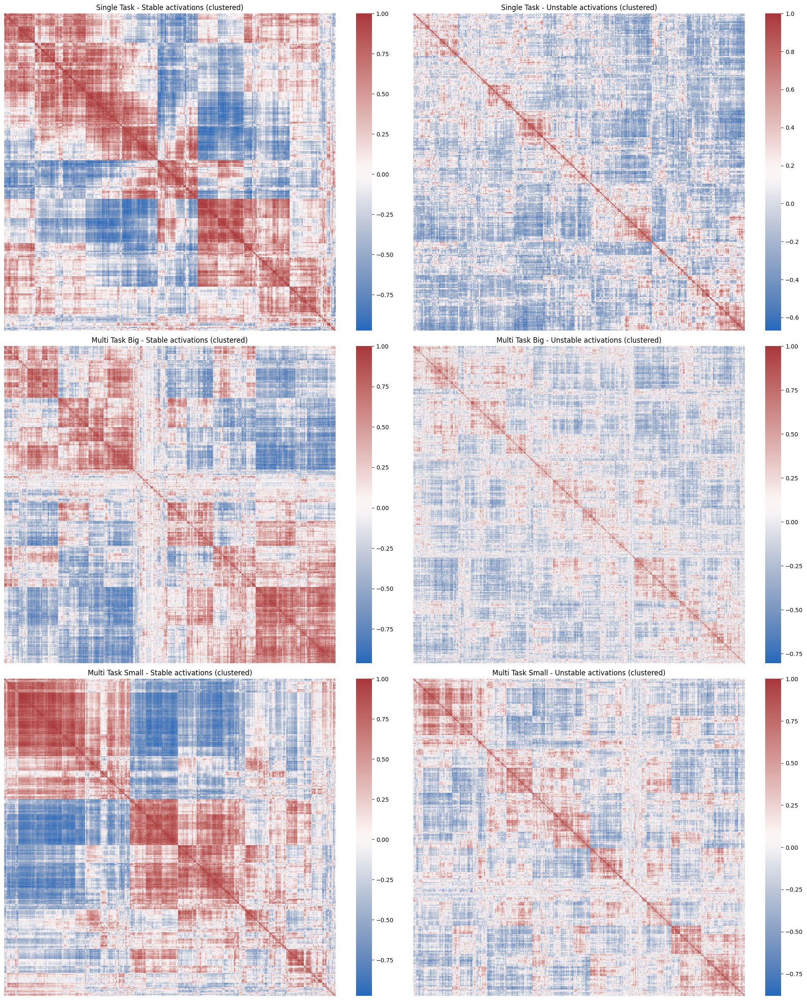

In [112]:
correlations_results = []
for z in [(z_single_task_stable, z_single_task_unstable),
          (z_multi_task_big_stable, z_multi_task_big_unstable),
          (z_multi_task_small_stable, z_multi_task_small_unstable)]:
    sim_stable, sim_stable_clustered = correlation_matrix(z[0])
    sim_unstable, sim_unstable_clustered = correlation_matrix(z[1])
    correlations_results.append((sim_stable, sim_stable_clustered, sim_unstable,
                                 sim_unstable_clustered))

# Plot one row per model, two columns (stable vs unstable)
fig, axes = plt.subplots(3, 2, figsize=(20, 24))

model_names = ['Single Task', 'Multi Task Big', 'Multi Task Small']

for i, (sim_stable, sim_stable_clustered, sim_unstable,
        sim_unstable_clustered) in enumerate(correlations_results):
    sns.heatmap(sim_stable_clustered,
                vmin=sim_stable.min(),
                vmax=sim_stable.max(),
                cmap='vlag',
                ax=axes[i, 0],
                xticklabels=False,
                yticklabels=False)
    axes[i, 0].set_title(f"{model_names[i]} - Stable activations (clustered)")

    sns.heatmap(sim_unstable_clustered,
                vmin=sim_unstable.min(),
                vmax=sim_unstable.max(),
                cmap='vlag',
                ax=axes[i, 1],
                xticklabels=False,
                yticklabels=False)
    axes[i, 1].set_title(f"{model_names[i]} - Unstable activations (clustered)")

plt.tight_layout()
plt.show()

In [116]:
# correlations_results = []
# for z in [(z_single_task_stable, z_single_task_unstable),
#           (z_multi_task_big_stable, z_multi_task_big_unstable),
#           (z_multi_task_small_stable, z_multi_task_small_unstable)]:
#     sim_stable, sim_stable_clustered = correlation_matrix(z[0])
#     sim_unstable, sim_unstable_clustered = correlation_matrix(z[1])
#     correlations_results.append((sim_stable, sim_stable_clustered, sim_unstable,
#                                  sim_unstable_clustered))

# # Plot one row per model, two columns (stable vs unstable)
# fig, axes = plt.subplots(3, 2, figsize=(20, 24))

# model_names = ['Single Task', 'Multi Task Big', 'Multi Task Small']

# for i, (sim_stable, sim_stable_clustered, sim_unstable,
#         sim_unstable_clustered) in enumerate(correlations_results):
#     sns.heatmap(abs(sim_stable_clustered),
#                 vmin=abs(sim_stable).min(),
#                 vmax=abs(sim_stable).max(),
#                 cmap='magma',
#                 ax=axes[i, 0],
#                 xticklabels=False,
#                 yticklabels=False)
#     axes[i, 0].set_title(f"{model_names[i]} - Stable activations (clustered)")

#     sns.heatmap(abs(sim_unstable_clustered),
#                 vmin=abs(sim_unstable).min(),
#                 vmax=abs(sim_unstable).max(),
#                 cmap='magma',
#                 ax=axes[i, 1],
#                 xticklabels=False,
#                 yticklabels=False)
#     axes[i, 1].set_title(f"{model_names[i]} - Unstable activations (clustered)")

# plt.tight_layout()
# plt.show()